# Tuning and training MC and ML models on Base Dataset

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os, cv2
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from scipy import stats


import json

from sklearn.model_selection import KFold

import torch
from torch import nn
from torch.utils.data import TensorDataset, DataLoader
import torch.optim as optim
import torch.nn.functional as F
from torchvision.transforms import functional, Resize

import time
from datetime import datetime
from tqdm import tqdm

from model_utils import ModelWrapper, myDataLoader, IteratedFRace
from model_utils import num_to_bin_string, bin_to_num, num_to_bin, ml_to_mc, mc_to_ml
from model_utils import rotate, rotate_sample, rotate_label, x_mirror, x_mirror_sample, x_mirror_label, y_mirror, y_mirror_sample, y_mirror_label,\
    label_balance_resample, apply_augmentations
from model_utils import sigmoid_accuracy, softmax_accuracy, bitwise_accuracy, bitwise_recall, bitwise_precision, bitwise_F1,\
    macro_metrics, hamming_distances, mean_hamming_distance
from model_utils.metrics import label_correlations, label_frequency, within_label_balance, between_label_imbalance, mean_mutual_information


In [3]:
torch.cuda.empty_cache()
DEV = 'cpu'

In [4]:
sns.set_theme(style="dark", font_scale=1.1)
PAL = sns.color_palette('bright')

DATASETS = os.path.join('..', '..', 'Datasets', 'numpy_datasets')
MODEL_PATH = os.path.join('..', 'models')
PLOTS = os.path.join('..', 'plots')
EVAL = os.path.join('..', 'evals')
ML_LOGS = os.path.join('..', 'opt_logs', 'ml_tuning')
MC_LOGS = os.path.join('..', 'opt_logs', 'mc_tuning')


## Data processing

In [5]:
angelina = os.path.join(DATASETS, "angelina.npz")
dsbi = os.path.join(DATASETS, "dsbi.npz")

data = np.load(angelina)
ood = np.load(dsbi)
print(data['train_x'].shape)
print(ood['test_x'].shape)

(69267, 40, 30, 3)
(45627, 40, 30, 3)


In [6]:
train_X = data["train_x"] / 255.
train_Y = data["train_y"]

val_X = data["val_x"] / 255.
val_Y = data["val_y"]

test_X = data["test_x"] / 255.
test_Y = data["test_y"]

N, p = train_Y.shape

In [7]:
train_Y_cat = ml_to_mc(train_Y)
val_Y_cat = ml_to_mc(val_Y)
test_Y_cat = ml_to_mc(test_Y)

C = train_Y_cat.shape[1]

In [8]:
ood_X = ood['test_x'] / 255.
ood_Y = ood['test_y']
ood_Y_cat = ml_to_mc(ood_Y)

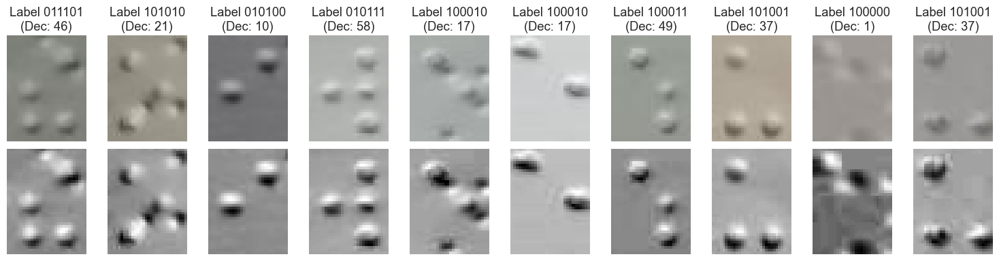

In [9]:
plt.figure(figsize=(15,4))
np.random.seed(101010)
subset = np.random.choice(np.arange(0, N), 10)

for i in range(10):
    sample = (train_X[subset[i]]).astype(np.float32)
    plt.subplot(2,10, i+1)
    plt.axis("off")
    lbl = ''.join(train_Y[subset[i]].astype(str))
    num_lbl = np.argmax(train_Y_cat[subset[i]])
    plt.imshow(sample)
    plt.title("Label {}\n(Dec: {})".format(lbl, num_lbl))
    
    gray = cv2.cvtColor(sample, cv2.COLOR_RGB2GRAY)
    plt.subplot(2,10, i+11)
    plt.axis("off")
    plt.gray()
    plt.imshow(gray)
plt.tight_layout()

## Augmentation Trials

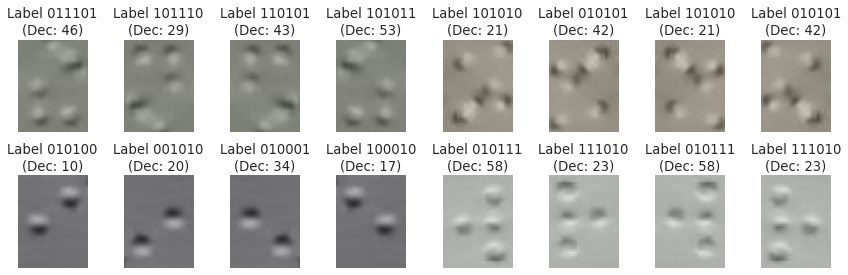

In [50]:
plt.figure(figsize=(12,4))
np.random.seed(101010)
subset = np.random.choice(np.arange(0, N), 5)

x_set = train_X[subset]
y_set = train_Y[subset]

x_rot = rotate_sample(x_set)
y_rot = rotate_label(y_set)

x_xmir = x_mirror_sample(x_set)
y_xmir = x_mirror_label(y_set)

x_ymir = y_mirror_sample(x_set)
y_ymir = y_mirror_label(y_set)

for i in range(4):
    sample = (x_set[i]).astype(np.float32)
    plt.subplot(2,8, 4*i+1)
    plt.axis("off")
    y = y_set[i]
    lbl = ''.join(y.astype(str))
    num_lbl = bin_to_num(y)
    plt.imshow(sample)
    plt.title("Label {}\n(Dec: {})".format(lbl, num_lbl))
    
    rot = (x_rot[i]).astype(np.float32)
    rot_y = y_rot[i]
    rot_lbl = ''.join(rot_y.astype(str))
    rot_num = bin_to_num(rot_y)
    plt.subplot(2,8, 4*i+2)
    plt.axis("off")
    plt.imshow(rot)
    plt.title("Label {}\n(Dec: {})".format(rot_lbl, rot_num))
    
    mirx =  (x_xmir[i]).astype(np.float32)
    mirx_y = y_xmir[i]
    mirx_lbl = ''.join(mirx_y.astype(str))
    mirx_num = bin_to_num(mirx_y)
    plt.subplot(2,8, 4*i+3)
    plt.axis("off")
    plt.imshow(mirx)
    plt.title("Label {}\n(Dec: {})".format(mirx_lbl, mirx_num))
    
    miry = (x_ymir[i]).astype(np.float32)
    miry_y = y_ymir[i]
    miry_lbl = ''.join(miry_y.astype(str))
    miry_num = bin_to_num(miry_y)
    plt.subplot(2,8, 4*i+4)
    plt.axis("off")
    plt.imshow(miry)
    plt.title("Label {}\n(Dec: {})".format(miry_lbl, miry_num))
plt.tight_layout()

In [10]:
base_ml_model_path = os.path.join(MODEL_PATH, 'base_ml_model_v2')
base_mc_model_path = os.path.join(MODEL_PATH, 'base_mc_model_v2')

with open(os.path.join(base_ml_model_path, 'history.json'), 'r') as ml_hist_json:
    base_ml_model_hist = json.load(ml_hist_json)
    
with open(os.path.join(base_mc_model_path, 'history.json'), 'r') as mc_hist_json:
    base_mc_model_hist = json.load(mc_hist_json)

In [11]:
base_ml_model_t_eps = base_ml_model_hist['trained_epochs']
base_mc_model_t_eps = base_mc_model_hist['trained_epochs']


In [12]:
base_ml_sample_diff = np.array(base_ml_model_hist['history']['sample_difficulty'])
base_mc_sample_diff = np.array(base_mc_model_hist['history']['sample_difficulty'])


In [13]:
base_mean_sample_diff = (base_ml_sample_diff + base_mc_sample_diff) / 2

In [14]:
T = .075
sum(base_ml_sample_diff <= T) / base_ml_sample_diff.shape[0], sum(base_mc_sample_diff <= T) / base_mc_sample_diff.shape[0], sum(base_mean_sample_diff <= T) / base_mc_sample_diff.shape[0]

(np.float64(0.9390907647220177),
 np.float64(0.13098589515931108),
 np.float64(0.4381451484834048))

In [23]:
base_mean_sample_diff[base_mean_sample_diff < 0.2].shape

(64097,)

In [24]:
base_mean_sample_diff[base_mean_sample_diff >= 0.2].shape

(5170,)

array([0.   , 0.025, 0.05 , 0.075, 0.1  , 0.125, 0.15 , 0.175, 0.2  ])

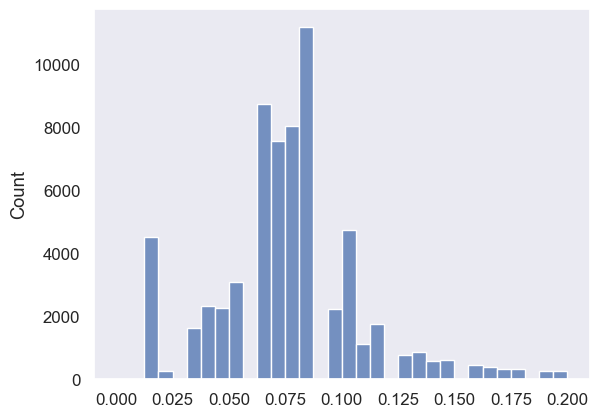

In [41]:
ax = sns.histplot(base_mean_sample_diff[base_mean_sample_diff < 0.2], bins=np.linspace(0, 0.2, 33))

In [32]:
ax.patches[4].get_x()

np.float64(0.08844246031746031)

In [68]:
print(f"Threshold T = {T} corresponds to {round(T * base_ml_model_t_eps, 1)} / {base_ml_model_t_eps} training epochs for ML model, and {round(T * base_mc_model_t_eps, 1)} / {base_mc_model_t_eps} training epochs for MC model")

Threshold T = 0.075 corresponds to 4.7 / 63 training epochs for ML model, and 2.4 / 32 training epochs for MC model


In [69]:

ml_sample_undersample = base_mean_sample_diff <= T

In [61]:
kfold = KFold(10, shuffle=True, random_state=220623).split(train_X)
kfold_split = [(t, v) for (t, v) in kfold]

fold0 = kfold_split[0]
fold0[0].shape, fold0[1].shape, train_X.shape

((62340,), (6927,), (69267, 40, 30, 3))

Strategy:
  - Identify largest (absolute) correlated labels
  - If largest correlation below specified threshold, terminate
  - Identify what co-occurences of labels need to be increased and decreased
  - Identify suitable undersample candidates to reduce label co-occurences
  - If none, identify suitable y-mirror candidates to upsample
  - If none, identify suitable x-mirror candidates to upsample
  - If none, identify suitable rotation candidates to upsample
  - If none, terminate

In [74]:
tr0_X, tr0_Y = train_X[fold0[0]], train_Y[fold0[0]]
undersample_candidates = ml_sample_undersample[fold0[0]]
EPS = 0.05
avg_abs_corrs = []
std_abs_corrs = []
max_abs_corrs = []

undersample = np.zeros(tr0_Y.shape[0]).astype(bool)
tr0_Y_rot = rotate_label(tr0_Y)
resample_rot = np.zeros(tr0_Y_rot.shape[0]).astype(bool)
tr0_Y_xmir = x_mirror_label(tr0_Y)
resample_xmir = np.zeros(tr0_Y_rot.shape[0]).astype(bool)
tr0_Y_ymir = y_mirror_label(tr0_Y)
resample_ymir = np.zeros(tr0_Y_rot.shape[0]).astype(bool)

iter = 0
while True:
    print('-'*20, f'ITERATION {iter}', '-'*20)
    iter += 1
    
    label_corrs_mean, label_corrs_std, label_corrs = label_correlations(
        np.vstack([tr0_Y[~undersample], tr0_Y_rot[resample_rot], tr0_Y_xmir[resample_xmir], tr0_Y_ymir[resample_ymir]])
    )
    abs_corrs = np.abs(label_corrs)
    abs_corrs_mean, abs_corrs_std = np.nanmean(abs_corrs), np.nanstd(abs_corrs)
    
    print(f'Mean correlation {label_corrs_mean} +- {label_corrs_std}')
    print(f'Mean absolute correlation {abs_corrs_mean} +- {abs_corrs_std}')
    
    i, j = np.unravel_index(np.nanargmax(abs_corrs), label_corrs.shape)
    max_cor = abs_corrs[i, j]

    avg_abs_corrs.append(abs_corrs_mean)
    std_abs_corrs.append(abs_corrs_std)
    max_abs_corrs.append(max_cor)
    if max_cor < EPS:
        print('Label imbalance sufficiently reduced')
        break
    else:
        cor = label_corrs[i, j]
        print(f'Large correlation at i = {i}, j = {j}. Correlation {round(cor, 4)}')
        li = int((i > j) or (cor > 0))
        nli = int(not li)
        lj = int((i > j) and (cor < 0))
        print(f'Need samples with label {i} = {li} and label {j} = {lj}. Undersample samples with label {i} = {nli} and label {j} = {lj}')
        
        mask_under = (tr0_Y[:, i] == nli) & (tr0_Y[:, j] == lj) & undersample_candidates & ~undersample
        print(f"{sum(mask_under)} undersampling candidates")
        if sum(mask_under) > 0:
            undersample = undersample | mask_under
            continue
        
        mask_rot = (tr0_Y_rot[:, i] == li) & (tr0_Y_rot[:, j] == lj) & ~resample_rot
        print(f"{sum(mask_rot)} rotation candidates")
        if sum(mask_rot) > 0:
            resample_rot = resample_rot | mask_rot
            continue
        
        mask_xmir = (tr0_Y_xmir[:, i] == li) & (tr0_Y_xmir[:, j] == lj) & ~resample_xmir
        print(f"{sum(mask_xmir)} x-mirror candidates")
        if sum(mask_xmir) > 0:
            resample_xmir = resample_xmir | mask_xmir
            continue
        
        mask_ymir = (tr0_Y_ymir[:, i] == li) & (tr0_Y_ymir[:, j] == lj) & ~resample_ymir
        print(f"{sum(mask_ymir)} y-mirror candidates")
        if sum(mask_ymir) > 0:
            resample_ymir = resample_ymir | mask_ymir
            continue
        
        print("No more resampling / undersampling candidates. Ending augmentation.")
        break

-------------------- ITERATION 0 --------------------
Mean correlation -0.03861245638600992 +- 0.5295077679785445
Mean absolute correlation 0.1442832363561467 +- 0.16553856213289952
Large correlation at i = 1, j = 0. Correlation -0.5621
Need samples with label 1 = 1 and label 0 = 1. Undersample samples with label 1 = 0 and label 0 = 1
16034 undersampling candidates
-------------------- ITERATION 1 --------------------
Mean correlation -0.06099668635850865 +- 0.3922152384281628
Mean absolute correlation 0.1353252407058191 +- 0.10510220668714405
Large correlation at i = 0, j = 1. Correlation -0.4135
Need samples with label 0 = 0 and label 1 = 0. Undersample samples with label 0 = 1 and label 1 = 0
0 undersampling candidates
23069 rotation candidates
-------------------- ITERATION 2 --------------------
Mean correlation -0.041674921320360506 +- 0.3678434480799882
Mean absolute correlation 0.12569224802312817 +- 0.09213970318586788
Large correlation at i = 1, j = 5. Correlation -0.293
Need

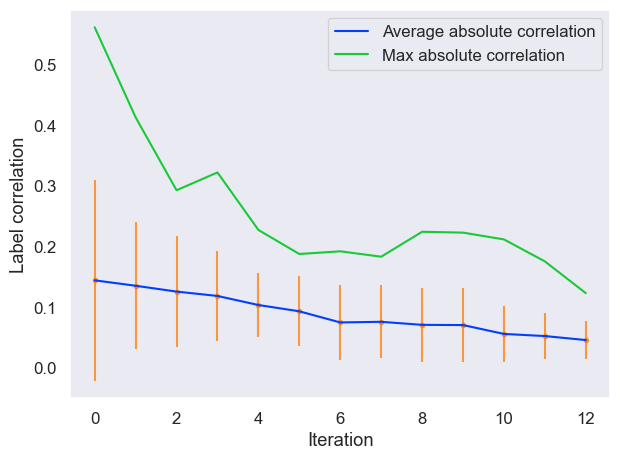

In [75]:
I = range(len(max_abs_corrs))
ax = sns.lineplot(x=I, y=avg_abs_corrs, color=PAL[0], label='Average absolute correlation', zorder=1)
ax.errorbar(I, avg_abs_corrs, yerr=std_abs_corrs, fmt='.', color=PAL[1], alpha=0.75, zorder=0)
sns.lineplot(x=I, y=max_abs_corrs, color=PAL[2], label='Max absolute correlation', zorder=1)
plt.xlabel('Iteration')
plt.ylabel('Label correlation')

plt.legend()
plt.tight_layout()

In [76]:
undersample.sum(), resample_rot.sum(), resample_xmir.sum(), resample_ymir.sum()

(27347, 48338, 37868, 8023)

In [77]:
new_tr0_Y = np.vstack([tr0_Y[~undersample], tr0_Y_rot[resample_rot], tr0_Y_xmir[resample_xmir], tr0_Y_ymir[resample_ymir]])
tr0_Y.shape, new_tr0_Y.shape

((62340, 6), (129222, 6))

In [79]:
c_mean, c_std, c = label_correlations(new_tr0_Y)
c_mean, c_std

(-0.023557766706652435, 0.12284277439662332)

<Axes: >

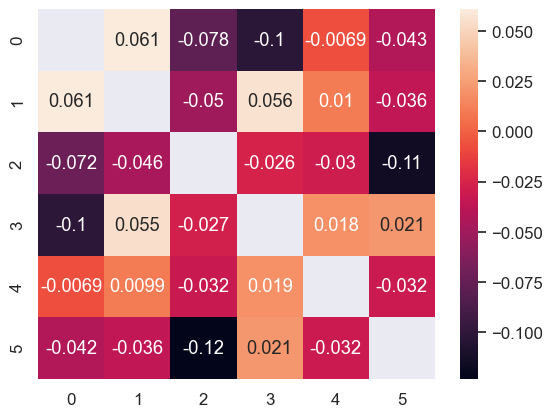

In [80]:
sns.heatmap(c, annot=True)

<Axes: >

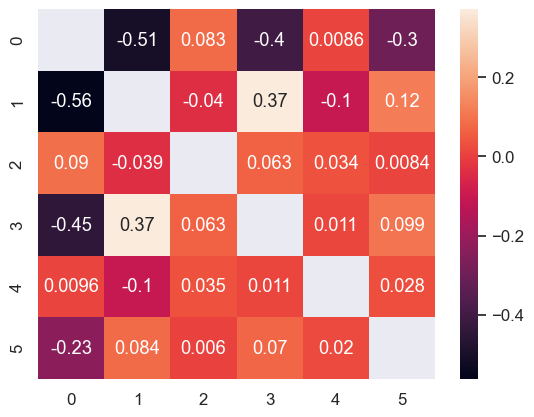

In [81]:
sns.heatmap(label_correlations(tr0_Y)[2], annot=True)

In [100]:
def label_balance_resample_old(trainY, undersample_candidates, eps=0.05):
    N = trainY.shape[0]

    undersample = np.zeros(N).astype(bool)
    trainY_rot = rotate_label(trainY)
    resample_rot = np.zeros(N).astype(bool)
    trainY_xmir = x_mirror_label(trainY)
    resample_xmir = np.zeros(N).astype(bool)
    trainY_ymir = y_mirror_label(trainY)
    resample_ymir = np.zeros(N).astype(bool)

    iter = 0
    while True:
        iter += 1
        
        _, _, label_corrs = label_correlations(
            np.vstack([trainY[~undersample], trainY_rot[resample_rot], trainY_xmir[resample_xmir], trainY_ymir[resample_ymir]])
        )
        abs_corrs = np.abs(label_corrs)
        i, j = np.unravel_index(np.nanargmax(abs_corrs), label_corrs.shape)
        max_cor = abs_corrs[i, j]

        if max_cor < eps:
            print(f'Label imbalance sufficiently reduced after {iter} iterations.')
            break
        else:
            cor = label_corrs[i, j]
            li = int((i > j) or (cor > 0))
            nli = int(not li)
            lj = int((i > j) and (cor < 0))
            
            mask_under = (trainY[:, i] == nli) & (trainY[:, j] == lj) & undersample_candidates & ~undersample
            if sum(mask_under) > 0:
                undersample = undersample | mask_under
                continue
            
            mask_rot = (trainY_rot[:, i] == li) & (trainY_rot[:, j] == lj) & ~resample_rot
            if sum(mask_rot) > 0:
                resample_rot = resample_rot | mask_rot
                continue
            
            mask_xmir = (trainY_xmir[:, i] == li) & (trainY_xmir[:, j] == lj) & ~resample_xmir
            if sum(mask_xmir) > 0:
                resample_xmir = resample_xmir | mask_xmir
                continue
            
            mask_ymir = (trainY_ymir[:, i] == li) & (trainY_ymir[:, j] == lj) & ~resample_ymir
            if sum(mask_ymir) > 0:
                resample_ymir = resample_ymir | mask_ymir
                continue
            
            print(f"No more resampling / undersampling candidates. Ending augmentation after {iter} iterations.")
            break
    return {
        'undersample': undersample,
        'rotate': resample_rot,
        'xmir': resample_xmir,
        'ymir': resample_ymir
    }

In [10]:
from model_utils import label_balance_resample as label_balance_resample
from model_utils import apply_augmentations

In [71]:
augments = {}
EPS = 0.05
for f, (train_ix, val_ix) in enumerate(kfold_split):
    trainX, trainY = train_X[train_ix], train_Y[train_ix]
    undersample_candidates = ml_sample_undersample[train_ix]
    augments[f] = label_balance_resample(trainY, undersample_candidates, EPS)

No more resampling / undersampling candidates. Ending augmentation after 13 iterations.
No more resampling / undersampling candidates. Ending augmentation after 14 iterations.
No more resampling / undersampling candidates. Ending augmentation after 13 iterations.
No more resampling / undersampling candidates. Ending augmentation after 14 iterations.
No more resampling / undersampling candidates. Ending augmentation after 13 iterations.
No more resampling / undersampling candidates. Ending augmentation after 14 iterations.
No more resampling / undersampling candidates. Ending augmentation after 14 iterations.
No more resampling / undersampling candidates. Ending augmentation after 13 iterations.
No more resampling / undersampling candidates. Ending augmentation after 14 iterations.
No more resampling / undersampling candidates. Ending augmentation after 13 iterations.


In [72]:
# under, rot, x, y
augments_impact = {
    f: aug['rotate'].sum() + aug['xmir'].sum() + aug['ymir'].sum() - aug['undersample'].sum() for f, aug in augments.items()
}
augments_impact

{0: 66882,
 1: 68324,
 2: 67101,
 3: 68337,
 4: 67062,
 5: 68352,
 6: 68349,
 7: 66919,
 8: 68214,
 9: 67048}

In [74]:
for f, (train_ix, val_ix) in enumerate(kfold_split):
    trainX, trainY = train_X[train_ix], train_Y[train_ix]
    trainX_new, trainY_new = apply_augmentations(trainX, trainY, augments, f)
    
    print(f"Old X shape {trainX.shape}, vs {trainX_new.shape}")
    print(f"Old Y shape {trainY.shape}, vs {trainY_new.shape}")

Old X shape (62340, 40, 30, 3), vs (129222, 40, 30, 3)
Old Y shape (62340, 6), vs (129222, 6)
Old X shape (62340, 40, 30, 3), vs (130664, 40, 30, 3)
Old Y shape (62340, 6), vs (130664, 6)
Old X shape (62340, 40, 30, 3), vs (129441, 40, 30, 3)
Old Y shape (62340, 6), vs (129441, 6)
Old X shape (62340, 40, 30, 3), vs (130677, 40, 30, 3)
Old Y shape (62340, 6), vs (130677, 6)
Old X shape (62340, 40, 30, 3), vs (129402, 40, 30, 3)
Old Y shape (62340, 6), vs (129402, 6)
Old X shape (62340, 40, 30, 3), vs (130692, 40, 30, 3)
Old Y shape (62340, 6), vs (130692, 6)
Old X shape (62340, 40, 30, 3), vs (130689, 40, 30, 3)
Old Y shape (62340, 6), vs (130689, 6)
Old X shape (62341, 40, 30, 3), vs (129260, 40, 30, 3)
Old Y shape (62341, 6), vs (129260, 6)
Old X shape (62341, 40, 30, 3), vs (130555, 40, 30, 3)
Old Y shape (62341, 6), vs (130555, 6)
Old X shape (62341, 40, 30, 3), vs (129389, 40, 30, 3)
Old Y shape (62341, 6), vs (129389, 6)


### Modeling framework testing

In [12]:
DEBUG = False

In [13]:
train_loader = myDataLoader(train_X, train_Y, batch_sz=16)
val_loader = myDataLoader(train_X, train_Y, batch_sz=16)
# filters 31, kernel_sz 5,  dense_sz 111, activs relu, padding 0,  in_sz torch.Size([40, 30, 3]), grey 0, sqr 0
model = ModelWrapper(in_size=(40,30,3), out_size=6, dev='cuda')

if DEBUG:
    test_hist = model.train(train_loader, val_loader, epochs=10, patience=2, verbose=1)
    test_t = model.reevaluate(train_loader)
    test_v = model.reevaluate(val_loader)

In [14]:
if DEBUG:
    train_pred = model.predict(train_loader)
    train_pred[:5]

Model training time

- With neither - 50s per training epoch, 28s per re-evaluation
    - Note, last two epochs seem out-of-the-norm. Avg of first 3: 34s per training epoch, 11s per re-evaluation
- With Grey scaling - 43s per training epoch, 20s per re-evaluation
    - Note, last two epochs seem out-of-the-norm. Avg of first 3: 35s per training epoch, 13s per re-evaluation
- With Square resizing - 42s per training epoch, 17s per re-evaluation
    - Note, last two epochs seem out-of-the-norm. Avg of first 3: 25s per training epoch, 8s per re-evaluation
- With both - 35s per training epoch, 21s per re-evaluation
    - Note, last two epochs seem out-of-the-norm. Avg of first 3: 22s per training epoch, 7s per re-evaluation

In [15]:
if DEBUG:
    save_path = os.path.join(MODEL_PATH, 'trial_model_20240828')
    model.save(save_path)
    new_model = ModelWrapper(dev='cpu')
    new_model.load(save_path)
    model.reevaluate(train_loader)

## FRace Results

In [10]:
param_space = {
    'lr': (0.0001, 0.02),
    'beta_1': (0.85, 0.95),
    'beta_2': (0.99, 0.9999),
    'l2': (0.0001, 0.03),
    'filters': (8, 64),
    'kernel_sz': (2,5),
    'dense_sz': (25, 150),
    'activs': (0, 2),
    'padding': (0, 1),
    'grey': (0, 1),
    'sqr': (0, 1)
}

param_names = [
    'Learning Rate', 'Beta1', 'Beta2', 'L2 Penalty',
    'Num Filters', 'Kernel Size', 'Dense Layer Size',
    'Activation function', 'Padding', 
    'Grey scaling', 'Square Input'
]

activations = {
    0: F.relu,
    1: F.tanh,
    2: F.leaky_relu
}

In [11]:
base_models_v0 = "20240926_142401"

log_path_ml = os.path.join(ML_LOGS, f"lb_{base_models_v0}_elite_set.json")
log_path_mc = os.path.join(MC_LOGS, f"lb_{base_models_v0}_elite_set.json")

In [12]:
with open(log_path_ml, 'r') as log_json:
    ml_elite_result = json.load(log_json)

with open(log_path_ml.replace('elite', 'historic'), 'r') as log_json:
    ml_history = json.load(log_json)

ml_history_df = pd.DataFrame(ml_history['model_configs']).T
ml_history_df.columns = param_space.keys()
ml_highest = str(ml_elite_result['final_ranks'][0])

ml_history_df['mean_loss'] = pd.DataFrame(ml_history['final_scores'], index=['mean_loss']).T.sort_index(key=lambda x: x.astype(int))
# ml_history_df['activs'] = ml_history_df.activs.apply(lambda a: activations[a].__name__)
ml_history_df.head()

,lr,beta_1,beta_2,l2,filters,kernel_sz,dense_sz,activs,padding,grey,sqr,mean_loss
0,0.000113,0.945299,0.998891,0.010081,46.0,3.0,146.0,2.0,0.0,1.0,0.0,0.704157
1,0.009393,0.854890,0.994761,0.016648,24.0,5.0,78.0,1.0,1.0,0.0,1.0,0.701959
2,0.007047,0.921129,0.995770,0.000635,36.0,4.0,111.0,0.0,1.0,0.0,1.0,0.705985
3,0.002719,0.878669,0.990455,0.013902,59.0,3.0,54.0,1.0,0.0,1.0,0.0,0.701993
4,0.004353,0.908427,0.992597,0.011393,56.0,3.0,95.0,0.0,1.0,0.0,1.0,0.703391


In [13]:
with open(log_path_mc, 'r') as log_json:
    mc_elite_result = json.load(log_json)

with open(log_path_mc.replace('elite', 'historic'), 'r') as log_json:
    mc_history = json.load(log_json)

mc_history_df = pd.DataFrame(mc_history['model_configs']).T
mc_history_df.columns = param_space.keys()
mc_highest = str(mc_elite_result['final_ranks'][0])

mc_history_df['mean_loss'] = pd.DataFrame(mc_history['final_scores'], index=['mean_loss']).T.sort_index(key=lambda x: x.astype(int))
# mc_history_df['activs'] = mc_history_df.activs.apply(lambda a: activations[a].__name__)
mc_history_df.head()

,lr,beta_1,beta_2,l2,filters,kernel_sz,dense_sz,activs,padding,grey,sqr,mean_loss
0,0.002307,0.901817,0.993475,0.011089,57.0,4.0,56.0,0.0,0.0,1.0,1.0,4.223131
1,0.009096,0.899704,0.998732,0.002388,23.0,3.0,113.0,1.0,1.0,0.0,0.0,4.228501
2,0.005376,0.928432,0.991958,0.017881,31.0,2.0,80.0,2.0,1.0,0.0,0.0,4.244521
3,0.003576,0.870047,0.995364,0.009633,49.0,4.0,147.0,1.0,0.0,1.0,1.0,4.173132
4,0.004177,0.948088,0.997547,0.007687,42.0,4.0,65.0,2.0,1.0,0.0,0.0,4.248913


### Results Visualisation

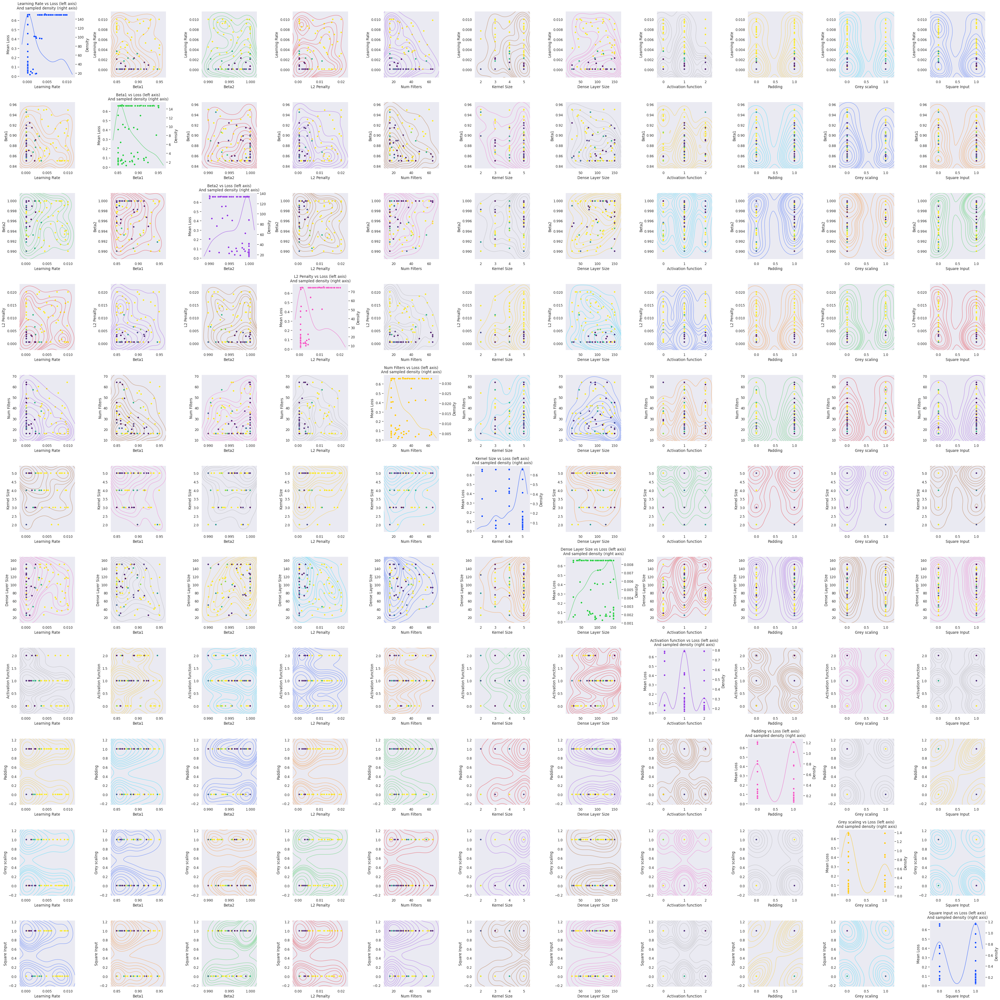

In [36]:
fig, axes = plt.subplots(11,11, figsize=(50,50))

for i in range(11**2):
    row = i // 11
    col = i % 11
    ax = axes[row, col]
    row_p = list(param_space.keys())[row]
    col_p = list(param_space.keys())[col]
    
    if row == col:
        sns.scatterplot(data=ml_history_df, x=col_p, y='mean_loss', ax=ax, color=PAL[i % len(PAL)])
        ax2 = ax.twinx()
        sns.kdeplot(data=ml_history_df, x=col_p, ax=ax2, color=PAL[i % len(PAL)], cut=True, alpha=0.6)
        ax.set_ylabel('Mean Loss')
        ax.set_xlabel(param_names[col])
        ax.set_title(f'{param_names[col]} vs Loss (left axis)\nAnd sampled density (right axis)')
    else:
        sns.scatterplot(data=ml_history_df, x=col_p, y=row_p, hue='mean_loss', ax=ax, palette='viridis')
        sns.kdeplot(data=ml_history_df, x=col_p, y=row_p, fill=False, ax=ax, cut=True, alpha=0.4, color=PAL[i % len(PAL)])
        ax.set_ylabel(param_names[row])
        ax.set_xlabel(param_names[col])
        ax.get_legend().remove()
# for i, p in enumerate(param_names):
#     axes[i, 0].set_ylabel(p)
#     axes[0, i].set_title(p)

plt.tight_layout()
plt.savefig(os.path.join(PLOTS, 'base_ml_model_frace.png'), bbox_to_inches='tight')
plt.show()

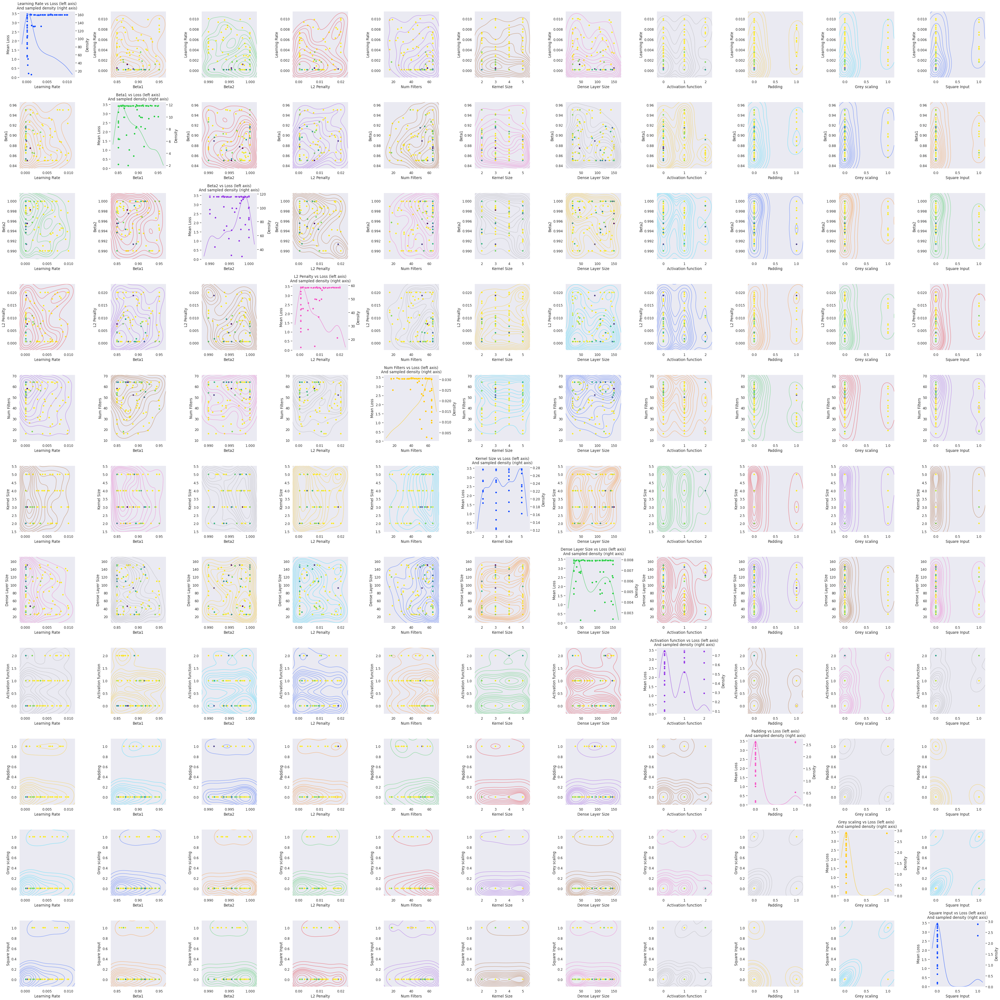

In [37]:
fig, axes = plt.subplots(11,11, figsize=(50,50))

for i in range(11**2):
    row = i // 11
    col = i % 11
    ax = axes[row, col]
    row_p = list(param_space.keys())[row]
    col_p = list(param_space.keys())[col]
    
    if row == col:
        sns.scatterplot(data=mc_history_df, x=col_p, y='mean_loss', ax=ax, color=PAL[i % len(PAL)])
        ax2 = ax.twinx()
        sns.kdeplot(data=mc_history_df, x=col_p, ax=ax2, color=PAL[i % len(PAL)], cut=True, alpha=0.6)
        ax.set_ylabel('Mean Loss')
        ax.set_xlabel(param_names[col])
        ax.set_title(f'{param_names[col]} vs Loss (left axis)\nAnd sampled density (right axis)')
    else:
        sns.scatterplot(data=mc_history_df, x=col_p, y=row_p, hue='mean_loss', ax=ax, palette='viridis')
        sns.kdeplot(data=mc_history_df, x=col_p, y=row_p, fill=False, ax=ax, cut=True, alpha=0.4, color=PAL[i % len(PAL)])
        ax.set_ylabel(param_names[row])
        ax.set_xlabel(param_names[col])
        ax.get_legend().remove()

# for i, p in enumerate(param_names):
#     axes[i, 0].set_ylabel(p)
#     axes[0, i].set_title(p)

plt.tight_layout()
plt.savefig(os.path.join(PLOTS, 'base_mc_model_frace.png'), bbox_to_inches='tight')
plt.show()

Notes
Iteration 1: 10600s = 2h55m
Iteration 2: 8600s = 2h23m
Iteration 3: 9100 = 2h41m
Iteration 4: 8900 = 2h28m
Iteration 5: 9500 = 2h38m

TOTAL: 46772s = 13h

In [38]:
from sklearn.decomposition import PCA, SparsePCA, KernelPCA
from sklearn.preprocessing import StandardScaler

In [39]:
ml_hist_x = ml_history_df[param_space.keys()]
ml_hist_y = ml_history_df['mean_loss']

SS = StandardScaler()
ml_hist_x_scaled = SS.fit_transform(ml_hist_x)

In [40]:
pca = PCA(n_components=2)
pca.fit(ml_hist_x_scaled)

ml_hist_x_pca = pca.transform(ml_hist_x_scaled)
print('Fraction explained variance:', sum(pca.explained_variance_ratio_))

Fraction explained variance: 0.3531115315886837


In [41]:
spca = SparsePCA(n_components=2)
spca.fit(ml_hist_x_scaled)
P = spca.components_.T  # loadings
ml_hist_x_spca = spca.transform(ml_hist_x_scaled)  # score
Xc = ml_hist_x_scaled - ml_hist_x_scaled.mean(axis=0)  # center data

explained_variance = np.trace(P @ ml_hist_x_spca.T @ ml_hist_x_spca @ P.T)
total_variance = np.trace(Xc.T @ Xc)
print('Fraction explained variance:', explained_variance / total_variance)

Fraction explained variance: 0.3386178243770395


In [42]:
kpca = KernelPCA(n_components=2, kernel='rbf')
kpca.fit(ml_hist_x_scaled)
ml_hist_x_kpca = kpca.transform(ml_hist_x_scaled)

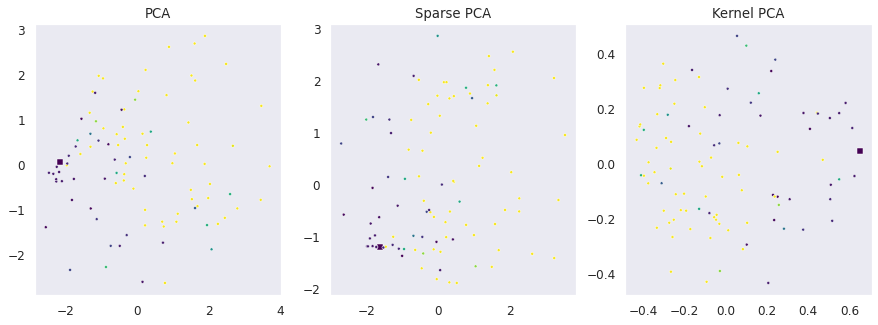

In [43]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

sns.scatterplot(x=ml_hist_x_pca[:, 0], y=ml_hist_x_pca[:, 1], style=ml_history_df.index == ml_highest, markers=['.', 's'], hue=ml_hist_y, palette='viridis', ax=axes[0])
axes[0].set_title('PCA')

sns.scatterplot(x=ml_hist_x_spca[:, 0], y=ml_hist_x_spca[:, 1], style=ml_history_df.index == ml_highest, markers=['.', 's'], hue=ml_hist_y, palette='viridis', ax=axes[1])
axes[1].set_title('Sparse PCA')

sns.scatterplot(x=ml_hist_x_kpca[:, 0], y=ml_hist_x_kpca[:, 1], style=ml_history_df.index == ml_highest, markers=['.', 's'], hue=ml_hist_y, palette='viridis', ax=axes[2])
axes[2].set_title('Kernel PCA')

axes[0].get_legend().remove()
axes[1].get_legend().remove()
axes[2].get_legend().remove()

In [44]:
mc_hist_x = mc_history_df[param_space.keys()]
mc_hist_y = mc_history_df['mean_loss']

SS = StandardScaler()
mc_hist_x_scaled = SS.fit_transform(mc_hist_x)

In [45]:
pca = PCA(n_components=2)
pca.fit(mc_hist_x_scaled)

mc_hist_x_pca = pca.transform(mc_hist_x_scaled)
print('Fraction explained variance:', sum(pca.explained_variance_ratio_))

Fraction explained variance: 0.3413678408969356


In [46]:
spca = SparsePCA(n_components=2)
spca.fit(mc_hist_x_scaled)
P = spca.components_.T  # loadings
mc_hist_x_spca = spca.transform(mc_hist_x_scaled)  # score
Xc = mc_hist_x_scaled - mc_hist_x_scaled.mean(axis=0)  # center data

explained_variance = np.trace(P @ mc_hist_x_spca.T @ mc_hist_x_spca @ P.T)
total_variance = np.trace(Xc.T @ Xc)
print('Fraction explained variance:', explained_variance / total_variance)

Fraction explained variance: 0.3297976915120315


In [47]:
kpca = KernelPCA(n_components=2, kernel='rbf')
kpca.fit(mc_hist_x_scaled)
mc_hist_x_kpca = kpca.transform(mc_hist_x_scaled)

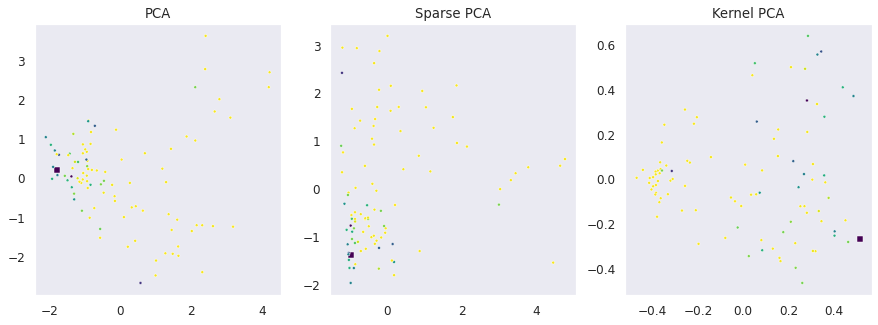

In [48]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))


sns.scatterplot(x=mc_hist_x_pca[:, 0], y=mc_hist_x_pca[:, 1], hue=mc_hist_y, style=mc_history_df.index == mc_highest, markers=['.', 's'], palette='viridis', ax=axes[0])
axes[0].set_title('PCA')

sns.scatterplot(x=mc_hist_x_spca[:, 0], y=mc_hist_x_spca[:, 1], hue=mc_hist_y, style=mc_history_df.index == mc_highest, markers=['.', 's'], palette='viridis', ax=axes[1])
axes[1].set_title('Sparse PCA')

sns.scatterplot(x=mc_hist_x_kpca[:, 0], y=mc_hist_x_kpca[:, 1], hue=mc_hist_y, style=mc_history_df.index == mc_highest, markers=['.', 's'], palette='viridis', ax=axes[2])
axes[2].set_title('Kernel PCA')

axes[0].get_legend().remove()
axes[1].get_legend().remove()
axes[2].get_legend().remove()

## Model re-training and evaluation

### Training

In [11]:
T = 0.075
RAND = 2024
EPSIL = 0.05

with open(os.path.join(MODEL_PATH, 'base_ml_model_v2', 'history.json'), 'r') as ml_hist_json:
    base_ml_sample_diff = np.array(json.load(ml_hist_json)['history']['sample_difficulty'])
with open(os.path.join(MODEL_PATH, 'base_mc_model_v2', 'history.json'), 'r') as mc_hist_json:
    base_mc_sample_diff = np.array(json.load(mc_hist_json)['history']['sample_difficulty'])
base_mean_sample_diff = (base_ml_sample_diff + base_mc_sample_diff) / 2
undersample_candidates = base_mean_sample_diff <= T

augments_full = label_balance_resample(train_Y, undersample_candidates, EPSIL)
train_X_aug, train_Y_aug = apply_augmentations(train_X, train_Y, augments=augments_full, shuffle=True, random_state=RAND)
train_Y_cat_aug = ml_to_mc(train_Y_aug)

No more resampling / undersampling candidates. Ending augmentation after 13 iterations.


In [12]:
class_freqs = pd.DataFrame()
class_freqs.index.name = 'Class'
class_freqs['Percent of Resampled set'] = train_Y_cat_aug.sum(axis=0) / train_Y_aug.shape[0] * 100
class_freqs['Rank in Resampled set'] = class_freqs.sort_values('Percent of Resampled set', ascending=False).reset_index().sort_values('Class').index + 1

class_freqs.head()

,Percent of Resampled set,Rank in Resampled set
Class,,
0,0.000000,64
1,0.419440,54
2,2.019296,16
3,0.927220,43
4,4.037200,3


In [21]:
class_freqs.sort_values('Percent of Resampled set', ascending=True).tail(10)

,Percent of Resampled set,Rank in Resampled set
Class,,
37,2.684975,9
44,2.684975,10
20,2.907563,8
51,3.057810,7
30,3.205275,6
5,3.980857,5
32,3.991987,4
4,4.037200,3
46,4.900426,2


In [13]:
# As per model_comparison_CBR
minority_classes = [28, 4, 35, 8, 32, 48, 55, 6, 44, 12, 39, 16, 20, 61, 57, 59, 41]
majority_classes = [21, 1, 17, 10, 30, 29, 14, 7, 5, 23, 58, 25, 13, 37, 15, 2, 50]

In [14]:
class_freqs.loc[minority_classes]

,Percent of Resampled set,Rank in Resampled set
Class,,
28,2.038772,15
4,4.037200,3
35,2.494383,13
8,0.110599,60
32,3.991987,4
48,0.906353,44
55,1.430132,30
6,1.110160,37
44,2.684975,10


In [15]:
class_freqs.loc[majority_classes]

,Percent of Resampled set,Rank in Resampled set
Class,,
21,0.223980,58
1,0.419440,54
17,0.609336,50
10,0.313711,55
30,3.205275,6
29,1.096944,38
14,1.958084,21
7,2.672454,11
5,3.980857,5


In [15]:
ml_elite_params = {key: val for key, val in zip(param_names, ml_elite_result['model_configs'][ml_highest])}
mc_elite_params = {key: val for key, val in zip(param_names, mc_elite_result['model_configs'][mc_highest])}
param_names

['Learning Rate',
 'Beta1',
 'Beta2',
 'L2 Penalty',
 'Num Filters',
 'Kernel Size',
 'Dense Layer Size',
 'Activation function',
 'Padding',
 'Grey scaling',
 'Square Input']

In [35]:
ml_size = train_X[0].shape
if ml_elite_params['Grey scaling']:
    ml_size = (ml_size[0], ml_size[1], 1)
if ml_elite_params['Square Input']:
    ml_size = (32, 32, ml_size[2])

ml_model = ModelWrapper(in_size=ml_size, filts=ml_elite_params['Num Filters'], kerns=ml_elite_params['Kernel Size'], pad=ml_elite_params['Padding'],
                        out_size=6, activ=activations[ml_elite_params['Activation function']], dense_sz=ml_elite_params['Dense Layer Size'],
                        beta_1=ml_elite_params['Beta1'], beta_2=ml_elite_params['Beta2'], lr=ml_elite_params['Learning Rate'], l2=ml_elite_params['L2 Penalty'],
                        grey_scaled=ml_elite_params['Grey scaling'], square_in=ml_elite_params['Square Input'], dev=DEV)

In [36]:
ml_train_loader = myDataLoader(train_X_aug, train_Y_aug, batch_sz=2048)
ml_val_loader = myDataLoader(val_X, val_Y, batch_sz=2048)

ml_model_hist = ml_model.train(ml_train_loader, ml_val_loader, epochs=100, patience=3, verbose=1)
ml_model.save(os.path.join(MODEL_PATH, 'lb_ml_model'))

E0, train loss: 0.683, val loss: 0.703 -- train acc: 0.0191, val acc: 0.0160
Saving history state...
E1, train loss: 0.068, val loss: 0.077 -- train acc: 0.8969, val acc: 0.8798
Saving history state...
E2, train loss: 0.026, val loss: 0.025 -- train acc: 0.9622, val acc: 0.9689
Saving history state...
E3, train loss: 0.023, val loss: 0.022 -- train acc: 0.9678, val acc: 0.9730
Saving history state...
E4, train loss: 0.021, val loss: 0.021 -- train acc: 0.9702, val acc: 0.9753
Saving history state...
E5, train loss: 0.020, val loss: 0.018 -- train acc: 0.9709, val acc: 0.9759
Saving history state...
E6, train loss: 0.018, val loss: 0.018 -- train acc: 0.9743, val acc: 0.9806
Saving history state...
E7, train loss: 0.018, val loss: 0.016 -- train acc: 0.9740, val acc: 0.9798
Saving history state...
E8, train loss: 0.016, val loss: 0.014 -- train acc: 0.9787, val acc: 0.9853
Saving history state...
E9, train loss: 0.015, val loss: 0.014 -- train acc: 0.9783, val acc: 0.9847
Saving history

In [43]:
del ml_train_loader, ml_val_loader, ml_model, ml_model_hist
torch.cuda.empty_cache()

In [16]:
mc_size = train_X[0].shape
if mc_elite_params['Grey scaling']:
    mc_size = (mc_size[0], mc_size[1], 1)
if mc_elite_params['Square Input']:
    mc_size = (32, 32, mc_size[2])

mc_model = ModelWrapper(in_size=mc_size, filts=mc_elite_params['Num Filters'], kerns=mc_elite_params['Kernel Size'], pad=mc_elite_params['Padding'],
                        out_size=64, activ=activations[mc_elite_params['Activation function']], dense_sz=mc_elite_params['Dense Layer Size'],
                        beta_1=mc_elite_params['Beta1'], beta_2=mc_elite_params['Beta2'], lr=mc_elite_params['Learning Rate'], l2=mc_elite_params['L2 Penalty'],
                        grey_scaled=mc_elite_params['Grey scaling'], square_in=mc_elite_params['Square Input'], dev=DEV)

In [18]:
mc_train_loader = myDataLoader(train_X_aug, train_Y_cat_aug, batch_sz=2048)
mc_val_loader = myDataLoader(val_X, val_Y_cat, batch_sz=2048)

mc_model_hist = mc_model.train(mc_train_loader, mc_val_loader, epochs=100, patience=3, verbose=1)
mc_model.save(os.path.join(MODEL_PATH, 'lb_mc_model'))

E0, train loss: 2.508, val loss: 4.013 -- train acc: 0.4144, val acc: 0.1634
Saving history state...
E1, train loss: 0.190, val loss: 0.195 -- train acc: 0.9505, val acc: 0.9472
Saving history state...
E2, train loss: 0.133, val loss: 0.132 -- train acc: 0.9654, val acc: 0.9643
Saving history state...
E3, train loss: 0.120, val loss: 0.122 -- train acc: 0.9686, val acc: 0.9684
Saving history state...
E4, train loss: 0.103, val loss: 0.100 -- train acc: 0.9734, val acc: 0.9737
Saving history state...
E5, train loss: 0.089, val loss: 0.084 -- train acc: 0.9775, val acc: 0.9791
Saving history state...
E6, train loss: 0.083, val loss: 0.076 -- train acc: 0.9794, val acc: 0.9806
Saving history state...
E7, train loss: 0.081, val loss: 0.075 -- train acc: 0.9801, val acc: 0.9831
Saving history state...
E8, train loss: 0.076, val loss: 0.065 -- train acc: 0.9814, val acc: 0.9849
Saving history state...
E9, train loss: 0.070, val loss: 0.059 -- train acc: 0.9828, val acc: 0.9858
Saving history

In [19]:
del mc_train_loader, mc_val_loader, mc_model, mc_model_hist
torch.cuda.empty_cache()

### Reloading

In [20]:
ml_model = ModelWrapper(dev=DEV)
ml_model.load(os.path.join(MODEL_PATH, 'lb_ml_model'))
ml_model_hist = ml_model.history

mc_model = ModelWrapper(dev=DEV)
mc_model.load(os.path.join(MODEL_PATH, 'lb_mc_model'))
mc_model_hist = mc_model.history

In [21]:
print(f"ml_model convergence epoch: {ml_model.conv_epoch} / {ml_model.trained_epochs}; mc_model convergence epoch: {mc_model.conv_epoch} / {mc_model.trained_epochs}")

ml_model convergence epoch: 48 / 57; mc_model convergence epoch: 95 / 100


Text(95, 0.9179278572828858, '0.992')

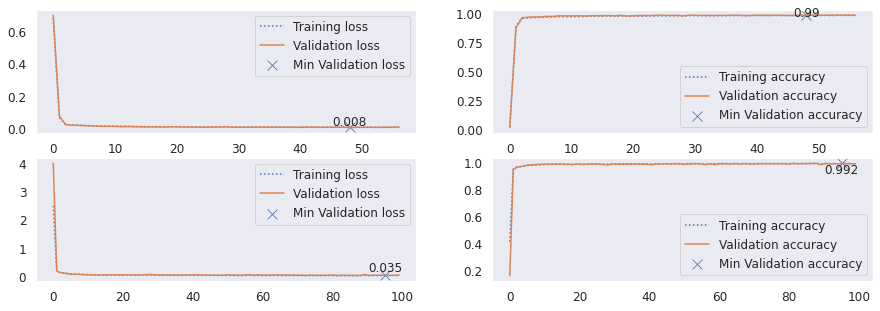

In [22]:
fig, axes = plt.subplots(2, 2, figsize=(15,5))

sns.lineplot(x=range(ml_model.trained_epochs), y=ml_model_hist['train_loss'], label='Training loss', linestyle=':', ax=axes[0, 0])
sns.lineplot(x=range(ml_model.trained_epochs), y=ml_model_hist['val_loss'], label='Validation loss', ax=axes[0, 0])
sns.scatterplot(x=[ml_model.conv_epoch], y=ml_model_hist['val_loss'][ml_model.conv_epoch], label='Min Validation loss',
                marker='x', s=100, ax=axes[0, 0])
axes[0, 0].text(x=ml_model.conv_epoch, y=2.5 * ml_model_hist['val_loss'][ml_model.conv_epoch],
                s=round(ml_model_hist['val_loss'][ml_model.conv_epoch], 3), fontsize=12, horizontalalignment='center')
             
sns.lineplot(x=range(ml_model.trained_epochs), y=ml_model_hist['train_acc'], label='Training accuracy', linestyle=':', ax=axes[0, 1])
sns.lineplot(x=range(ml_model.trained_epochs), y=ml_model_hist['val_acc'], label='Validation accuracy', ax=axes[0, 1])
sns.scatterplot(x=[ml_model.conv_epoch], y=ml_model_hist['val_acc'][ml_model.conv_epoch], label='Min Validation accuracy',
                marker='x', s=100, ax=axes[0, 1])
axes[0, 1].text(x=ml_model.conv_epoch, y=0.985 * ml_model_hist['val_acc'][ml_model.conv_epoch],
                s=round(ml_model_hist['val_acc'][ml_model.conv_epoch], 3), fontsize=12, horizontalalignment='center')
             
sns.lineplot(x=range(mc_model.trained_epochs), y=mc_model_hist['train_loss'], label='Training loss', linestyle=':', ax=axes[1, 0])
sns.lineplot(x=range(mc_model.trained_epochs), y=mc_model_hist['val_loss'], label='Validation loss', ax=axes[1, 0])
sns.scatterplot(x=[mc_model.conv_epoch], y=mc_model_hist['val_loss'][mc_model.conv_epoch], label='Min Validation loss',
                marker='x', s=100, ax=axes[1, 0])
axes[1, 0].text(x=mc_model.conv_epoch, y=5 * mc_model_hist['val_loss'][mc_model.conv_epoch],
                s=round(mc_model_hist['val_loss'][mc_model.conv_epoch], 3), fontsize=12, horizontalalignment='center')
             
sns.lineplot(x=range(mc_model.trained_epochs), y=mc_model_hist['train_acc'], label='Training accuracy', linestyle=':', ax=axes[1, 1])
sns.lineplot(x=range(mc_model.trained_epochs), y=mc_model_hist['val_acc'], label='Validation accuracy', ax=axes[1, 1])
sns.scatterplot(x=[mc_model.conv_epoch], y=mc_model_hist['val_acc'][mc_model.conv_epoch], label='Min Validation accuracy',
                marker='x', s=100, ax=axes[1, 1])
axes[1, 1].text(x=mc_model.conv_epoch, y=0.925 * mc_model_hist['val_acc'][mc_model.conv_epoch],
                s=round(mc_model_hist['val_acc'][mc_model.conv_epoch], 3), fontsize=12, horizontalalignment='center')

### Eval

In [100]:
ml_test_loader = myDataLoader(test_X, test_Y, batch_sz=2048)
ml_ood_loader = myDataLoader(ood_X, ood_Y, batch_sz=2048)

mc_test_loader = myDataLoader(test_X, test_Y_cat, batch_sz=2048)
mc_ood_loader = myDataLoader(ood_X, ood_Y_cat, batch_sz=2048)

In [102]:
ml_test_pred, ml_test_pred_prob = ml_model.predict(ml_test_loader, return_proba=True)
ml_ood_pred, ml_ood_pred_prob = ml_model.predict(ml_ood_loader, return_proba=True)

mc_test_pred, mc_test_pred_prob = mc_model.predict(mc_test_loader, return_proba=True)
mc_test_pred_bits = num_to_bin(mc_test_pred)
mc_ood_pred, mc_ood_pred_prob = mc_model.predict(mc_ood_loader, return_proba=True)
mc_ood_pred_bits = num_to_bin(mc_ood_pred)

In [112]:
# from .metrics import sigmoid_accuracy, softmax_accuracy, bitwise_accuracy, bitwise_recall, bitwise_precision, \
#     bitwise_F1, hamming_distances

results = pd.DataFrame(columns=[
    'Model Type', 'Configuration',
    'Character Accuracy', 'Dot Accuracy', 'Dot Recall', 'Dot Precision',
    'Dot F1', 'Hamming Distance'
])

preds_sets = [ml_test_pred, ml_ood_pred, mc_test_pred_bits, mc_ood_pred_bits]
labels_sets = [test_Y, ood_Y] * 2
models_sets = ['Multi-label'] * 2 + ['Multi-class'] * 2
train_sets = ['Base Train'] * 4
eval_sets = ['Base Test', 'OOD Test'] * 2

for i, (preds, labels, model, train_set, eval_set) in enumerate(zip(
    preds_sets, labels_sets, models_sets, train_sets, eval_sets
)):
    acc = sigmoid_accuracy(preds, labels)

    new_row = [
        model, f"{train_set}\n{eval_set}", sigmoid_accuracy(preds, labels), bitwise_accuracy(preds, labels),
        bitwise_recall(preds, labels), bitwise_precision(preds, labels), bitwise_F1(preds, labels), mean_hamming_distance(preds, labels)
    ]
    results.loc[results.shape[0]] = new_row


In [110]:
results

,Model Type,Configuration,Character Accuracy,Dot Accuracy,Dot Recall,Dot Precision,Dot F1,Hamming Distance
0,Multi-label,Base Train - Base Test,0.981192,0.996505,0.996123,0.996795,0.996459,0.020972
1,Multi-label,Base Train - OOD Test,0.923401,0.985860,0.997085,0.971942,0.984353,0.084840
2,Multi-class,Base Train - Base Test,0.971954,0.994369,0.992274,0.996305,0.994285,0.033788
3,Multi-class,Base Train - OOD Test,0.861244,0.973448,0.983065,0.958475,0.970615,0.159314


In [300]:
results.to_csv(os.path.join(EVAL, 'base_cbr_test_ood_metrics.csv'), index=False)

In [126]:
sns.set_style('darkgrid')

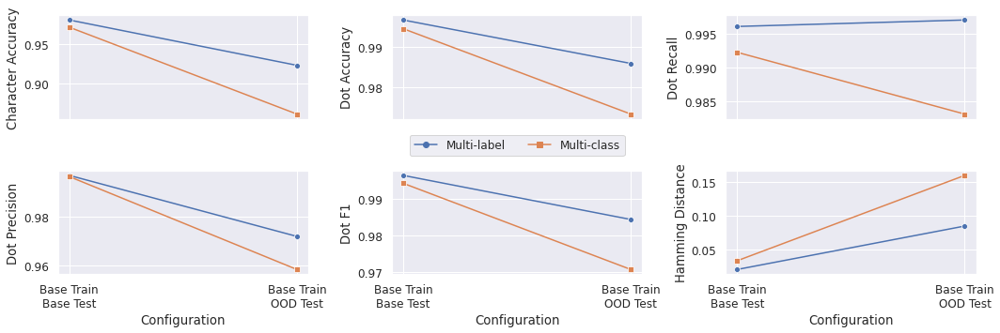

In [127]:
fig, axes = plt.subplots(2, 3, figsize=(15,5), sharex=True)
metrics = results.columns[2:]

for i, met in enumerate(metrics):
    ax = axes[i // 3, i % 3]
    sns.lineplot(data=results, x='Configuration', y=met, hue='Model Type', style='Model Type', markers=['o', 's'], dashes=False, ax=ax, legend=i==1)

axes[0,1].legend(ncol=2, loc='upper center', bbox_to_anchor=(0.5, -0.1))
plt.tight_layout()

In [248]:
class_freqs = pd.DataFrame()
class_freqs.index.name = 'Class'
class_freqs['Percent of Train set'] = train_Y_cat.sum(axis=0) / train_Y.shape[0] * 100
class_freqs['Rank in Train set'] = class_freqs.sort_values('Percent of Train set', ascending=False).reset_index().sort_values('Class').index
class_freqs['Percent of Test set'] = test_Y_cat.sum(axis=0) / test_Y.shape[0] * 100
class_freqs['Rank in Test set'] = class_freqs.sort_values('Percent of Test set', ascending=False).reset_index().sort_values('Class').index
class_freqs['Percent of OOD set'] = ood_Y_cat.sum(axis=0) / ood_Y.shape[0] * 100
class_freqs['Rank in OOD set'] = class_freqs.sort_values('Percent of OOD set', ascending=False).reset_index().sort_values('Class').index
label_freqs = pd.DataFrame()
label_freqs.index.name = 'Label'
label_freqs['Percent of Train set'] = train_Y.sum(axis=0) / train_Y.shape[0] * 100
label_freqs['Rank in Train set'] = label_freqs.sort_values('Percent of Train set', ascending=False).reset_index().sort_values('Label').index
label_freqs['Percent of Test set'] = test_Y.sum(axis=0) / test_Y.shape[0] * 100
label_freqs['Rank in Test set'] = label_freqs.sort_values('Percent of Test set', ascending=False).reset_index().sort_values('Label').index
label_freqs['Percent of OOD set'] = ood_Y.sum(axis=0) / ood_Y.shape[0] * 100
label_freqs['Rank in OOD set'] = label_freqs.sort_values('Percent of OOD set', ascending=False).reset_index().sort_values('Label').index
display(class_freqs.head())
display(label_freqs)

,Percent of Train set,Rank in Train set,Percent of Test set,Rank in Test set,Percent of OOD set,Rank in OOD set
Class,,,,,,
0,0.000000,63,0.000000,63,0.000000,63
1,8.217477,1,7.723036,1,2.413045,12
2,2.090462,15,2.097204,15,1.420212,25
3,1.824823,19,1.797603,20,2.480987,11
4,0.093840,47,0.024967,52,1.808140,15


,Percent of Train set,Rank in Train set,Percent of Test set,Rank in Test set,Percent of OOD set,Rank in OOD set
Label,,,,,,
0,65.849539,0,65.354527,0,47.894887,2
1,50.929014,3,51.314913,3,48.190764,1
2,55.916959,1,55.575899,1,42.157056,3
3,47.403525,4,47.819574,4,39.862362,4
4,52.671546,2,53.170772,2,53.915445,0
5,22.727995,5,22.986019,5,35.621452,5


In [255]:
# from .metrics import sigmoid_accuracy, softmax_accuracy, bitwise_accuracy, bitwise_recall, bitwise_precision, \
#     bitwise_F1, hamming_distances

per_class_results = pd.DataFrame(columns=[
    'Model Type', 'Configuration', 'Class',
    'Character Accuracy', 'Dot Accuracy', 'Dot Recall', 'Dot Precision',
    'Dot F1', 'Hamming Distance'
])

preds_sets = [ml_test_pred, ml_ood_pred, mc_test_pred_bits, mc_ood_pred_bits]
labels_sets = [test_Y, ood_Y] * 2
models_sets = ['Multi-label'] * 2 + ['Multi-class'] * 2
train_sets = ['Base Train'] * 4
eval_sets = ['Base Test', 'OOD Test'] * 2

for i, (preds, labels, model, train_set, eval_set) in enumerate(zip(
    preds_sets, labels_sets, models_sets, train_sets, eval_sets
)):

    for c in range(64):
        class_mask = bin_to_num(labels) == c
        mets = [c]
        if not np.any(class_mask):
            mets += [np.nan] * 6
        else:
            class_preds = preds[class_mask]
            class_labels = labels[class_mask]
            mets += [sigmoid_accuracy(class_preds, class_labels), bitwise_accuracy(class_preds, class_labels),
                   bitwise_recall(class_preds, class_labels), bitwise_precision(class_preds, class_labels),
                   bitwise_F1(class_preds, class_labels), mean_hamming_distance(class_preds, class_labels)
                  ]
        new_row = [model, f"{train_set}\n{eval_set}"] + mets
        per_class_results.loc[per_class_results.shape[0]] = new_row


In [257]:
per_class_results = per_class_results.merge(class_freqs, on='Class')
per_class_results.head()

,Model Type,Configuration,Class,Character Accuracy,Dot Accuracy,Dot Recall,Dot Precision,Dot F1,Hamming Distance,Percent of Train set,Rank in Train set,Percent of Test set,Rank in Test set,Percent of OOD set,Rank in OOD set
0,Multi-label,Base Train\nBase Test,0,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,63,0.000000,63,0.000000,63
1,Multi-label,Base Train\nOOD Test,0,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,63,0.000000,63,0.000000,63
2,Multi-class,Base Train\nBase Test,0,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,63,0.000000,63,0.000000,63
3,Multi-class,Base Train\nOOD Test,0,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,63,0.000000,63,0.000000,63
4,Multi-label,Base Train\nBase Test,1,0.980603,0.996228,0.998922,0.978881,0.9888,0.022629,8.217477,1,7.723036,1,2.413045,12


In [256]:
per_class_results

,Model Type,Configuration,Class,Character Accuracy,Dot Accuracy,Dot Recall,Dot Precision,Dot F1,Hamming Distance
0,Multi-label,Base Train\nBase Test,0,NaN,NaN,NaN,NaN,NaN,NaN
1,Multi-label,Base Train\nBase Test,1,0.980603,0.996228,0.998922,0.978881,0.988800,0.022629
2,Multi-label,Base Train\nBase Test,2,0.964286,0.993386,1.000000,0.961832,0.980545,0.039683
3,Multi-label,Base Train\nBase Test,3,0.967593,0.994599,0.997685,0.986270,0.991945,0.032407
4,Multi-label,Base Train\nBase Test,4,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
...,...,...,...,...,...,...,...,...,...
251,Multi-class,Base Train\nOOD Test,59,0.025271,0.837545,0.805054,1.000000,0.892000,0.974729
252,Multi-class,Base Train\nOOD Test,60,0.997828,0.999397,0.999638,0.999457,0.999547,0.003621
253,Multi-class,Base Train\nOOD Test,61,0.826087,0.971014,0.966304,0.998876,0.982320,0.173913
254,Multi-class,Base Train\nOOD Test,62,0.954386,0.992398,0.990877,1.000000,0.995418,0.045614


In [229]:

from whittaker_eilers import WhittakerSmoother

def optimal_smooth(series, order, bsc=False):
    WS = WhittakerSmoother(lmbda=1, order=order, data_length=len(series), weights=~pd.isna(series))
    WS_o = WS.smooth_optimal(series.fillna(0.), break_serial_correlation=bsc)
    
    return WS_o.get_optimal().get_smoothed()

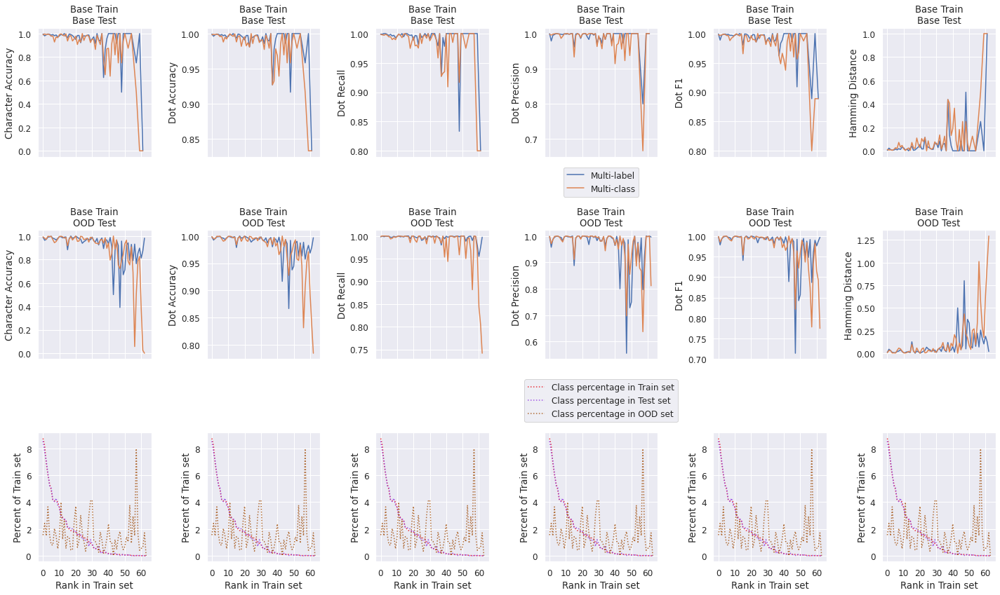

In [285]:
metrics = results.columns[2:]
M = len(metrics)
fig, axes = plt.subplots(3, M, figsize=(20,12), sharex=True)

for i, met in enumerate(metrics):
    # met_smoothed = optimal_smooth(per_class_results[met], order=20)
    met_smoothed = per_class_results[met]
    for c, con in enumerate(per_class_results['Configuration'].unique()):
        ax = axes[c,i]
        # ax.grid(False)
        ax.set_title(con)
        sns.lineplot(data=per_class_results[per_class_results.Configuration == con],
                     x='Rank in Train set', y=met_smoothed,
                     hue='Model Type', #style='Model Type',
                     ax=ax, legend=(i==3 and c==0))

axes[0,3].legend(ncol=1, loc='upper center', bbox_to_anchor=(0.5, -.05))
xs = range(0, 64, 10)
for i in range(M):
    ax = axes[2,i]
    leg = (i==3)
    sns.lineplot(data=class_freqs, x='Rank in Train set', y='Percent of Train set',
                color=PAL[3], alpha=0.8, linestyle=':',
                label='Class percentage in Train set', ax=ax, legend=leg)
    sns.lineplot(data=class_freqs, x='Rank in Train set', y=f'Percent of Test set',
                color=PAL[4], alpha=0.8, linestyle=':',
                label=f'Class percentage in Test set', ax=ax, legend=leg)
    sns.lineplot(data=class_freqs, x='Rank in Train set', y=f'Percent of OOD set',
                color=PAL[5], alpha=0.8, linestyle=':',
                label=f'Class percentage in OOD set', ax=ax, legend=leg)
    if leg:
        ax.legend(ncol=1, loc='lower center', bbox_to_anchor=(0.5, 1.05))
    axes[2,i].set_xticks(xs)
plt.tight_layout()

In [301]:
per_class_results.to_csv(os.path.join(EVAL, 'base_cbr_per_class_metrics.csv'), index=False)

In [291]:
# from .metrics import sigmoid_accuracy, softmax_accuracy, bitwise_accuracy, bitwise_recall, bitwise_precision, \
#     bitwise_F1, hamming_distances

per_label_results = pd.DataFrame(columns=[
    'Model Type', 'Configuration', 'Label',
    'Dot Accuracy', 'Dot Recall', 'Dot Precision', 'Dot F1'
])

preds_sets = [ml_test_pred, ml_ood_pred, mc_test_pred_bits, mc_ood_pred_bits]
labels_sets = [test_Y, ood_Y] * 2
models_sets = ['Multi-label'] * 2 + ['Multi-class'] * 2
train_sets = ['Base Train'] * 4
eval_sets = ['Base Test', 'OOD Test'] * 2

for i, (preds, labels, model, train_set, eval_set) in enumerate(zip(
    preds_sets, labels_sets, models_sets, train_sets, eval_sets
)):
    TP, TN, FP, FN = macro_metrics(preds, labels)
    HAMS = hamming_distances(class_preds, class_labels)
    for l in range(6):
        mets = [l]
        tp, tn, fp, fn = TP[l], TN[l], FP[l], FN[l]
        mets += [(tp+tn) / (tp+tn+fp+fn),
                 tp / (tp + fn), tp / (tp + fp),
                 tp / (tp + 0.5 * (fp + fn))
                ]
        new_row = [model, f"{train_set}\n{eval_set}"] + mets
        per_label_results.loc[per_label_results.shape[0]] = new_row


In [292]:
per_label_results = per_label_results.merge(label_freqs, on='Label')
per_label_results.head()

,Model Type,Configuration,Label,Dot Accuracy,Dot Recall,Dot Precision,Dot F1,Percent of Train set,Rank in Train set,Percent of Test set,Rank in Test set,Percent of OOD set,Rank in OOD set
0,Multi-label,Base Train\nBase Test,0,0.997503,0.997453,0.998725,0.998089,65.849539,0,65.354527,0,47.894887,2
1,Multi-label,Base Train\nOOD Test,0,0.979508,0.999085,0.959777,0.979036,65.849539,0,65.354527,0,47.894887,2
2,Multi-class,Base Train\nBase Test,0,0.997587,0.998345,0.997963,0.998154,65.849539,0,65.354527,0,47.894887,2
3,Multi-class,Base Train\nOOD Test,0,0.956911,0.995699,0.920782,0.956776,65.849539,0,65.354527,0,47.894887,2
4,Multi-label,Base Train\nBase Test,1,0.996921,0.996594,0.997403,0.996998,50.929014,3,51.314913,3,48.190764,1


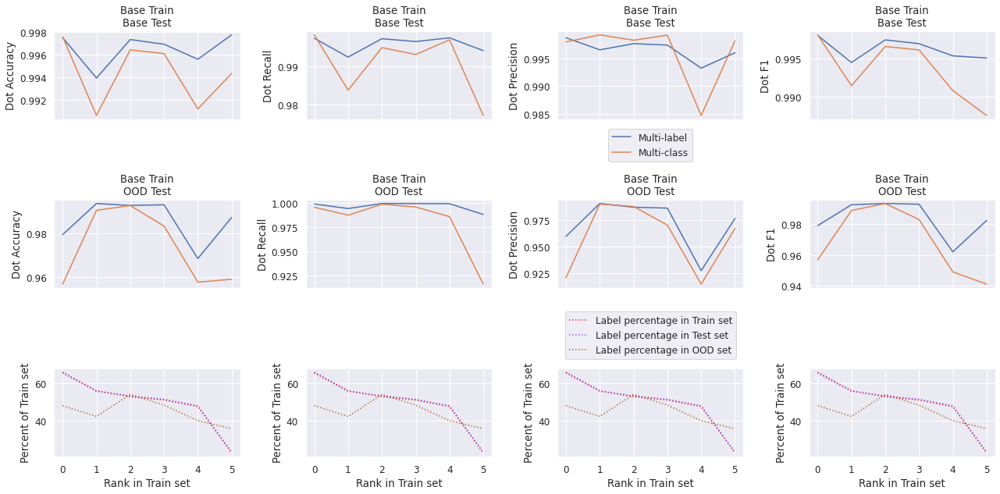

In [298]:
metrics = results.columns[3:7]
M = len(metrics)
fig, axes = plt.subplots(3, M, figsize=(18,9), sharex=True)

for i, met in enumerate(metrics):
    # met_smoothed = optimal_smooth(per_class_results[met], order=20)
    met_smoothed = per_label_results[met]
    for c, con in enumerate(per_label_results['Configuration'].unique()):
        ax = axes[c,i]
        # ax.grid(False)
        ax.set_title(con)
        sns.lineplot(data=per_label_results[per_label_results.Configuration == con],
                     x='Rank in Train set', y=met_smoothed,
                     hue='Model Type', #style='Model Type',
                     ax=ax, legend=(i==2 and c==0))

axes[0,2].legend(ncol=1, loc='upper center', bbox_to_anchor=(0.5, -.05))
xs = range(0, 6, 1)
for i in range(M):
    ax = axes[2,i]
    leg = (i==2)
    sns.lineplot(data=label_freqs, x='Rank in Train set', y='Percent of Train set',
                color=PAL[3], alpha=0.8, linestyle=':',
                label='Label percentage in Train set', ax=ax, legend=leg)
    sns.lineplot(data=label_freqs, x='Rank in Train set', y=f'Percent of Test set',
                color=PAL[4], alpha=0.8, linestyle=':',
                label=f'Label percentage in Test set', ax=ax, legend=leg)
    sns.lineplot(data=label_freqs, x='Rank in Train set', y=f'Percent of OOD set',
                color=PAL[5], alpha=0.8, linestyle=':',
                label=f'Label percentage in OOD set', ax=ax, legend=leg)
    if leg:
        ax.legend(ncol=1, loc='lower center', bbox_to_anchor=(0.5, 1.05))
    axes[2,i].set_xticks(xs)
plt.tight_layout()

In [302]:
per_label_results.to_csv(os.path.join(EVAL, 'base_cbr_per_label_metrics.csv'), index=False)